# 06B. Dog Re-Identification Evaluation Optimized — `proyecto_integrador_v2`

Este notebook corresponde al **Paso 06B optimizado** del pipeline `proyecto_integrador_v2`.

## Objetivo

Evaluar si el sistema puede encontrar **el mismo perro** usando imágenes tomadas desde distintas poses, ángulos, fondos o condiciones de iluminación.

Hasta ahora:

```text
01. curaduría visual
02. detección y crop con YOLO
03. embeddings visuales
04. búsqueda Top-K por similitud coseno
05. prueba end-to-end con imágenes externas
```

El Paso 06B agrega la evaluación optimizada que realmente responde al caso de perros perdidos/encontrados:

```text
¿El sistema encuentra al mismo perro aunque la foto sea diferente?
```

## Estructura esperada

Coloca varias fotos del mismo perro en una carpeta por identidad:

```text
/content/drive/MyDrive/proyecto_integrador_v2/raw_data/identity_test/
│
├── dog_001/
│   ├── front.jpg
│   ├── side.jpg
│   └── sitting.jpg
│
├── dog_002/
│   ├── front.jpg
│   ├── side.jpg
│   └── walking.jpg
│
└── dog_003/
    ├── img_1.jpg
    └── img_2.jpg
```

Cada carpeta representa un perro distinto.  
Cada imagen dentro de esa carpeta representa una vista diferente del mismo perro.

## Métricas principales

Este notebook calcula:

| Métrica | Interpretación |
|---|---|
| **Top-1 Same Dog Accuracy** | El vecino más cercano es el mismo perro |
| **Top-5 Same Dog Accuracy** | El mismo perro aparece entre los 5 vecinos más similares |
| **Mean same-dog cosine** | Similitud promedio entre fotos del mismo perro |
| **Mean different-dog cosine** | Similitud promedio entre perros distintos |
| **Separation margin** | Diferencia entre similitud mismo perro y perro distinto |
| **False positives** | Perros distintos que aparecen demasiado similares |
| **False negatives** | Mismo perro que no aparece entre los más similares |

Para producto, la métrica más importante suele ser **Top-5 Same Dog Accuracy**, porque en una app real se pueden mostrar varios candidatos para revisión humana.

In [1]:
# 0. Instalación de dependencias

!pip install -q ultralytics tensorflow opencv-python pillow pandas numpy matplotlib tqdm scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 45.0 MB/s eta 0:00:00


## Diferencia contra el Paso 06 original

Esta versión **06B optimizada** formaliza los experimentos que antes se hicieron reutilizando el Paso 06.

Usa la configuración seleccionada a partir de las pruebas de re-identificación:

```python
CONF_THRESHOLD = 0.15
CROP_MARGIN = 0.35
```

y guarda sus resultados en rutas separadas para no sobrescribir el Paso 06 base:

```text
processed_data/step06b_reidentification_eval_optimized/
reports/tables/step06b_optimized_...
reports/figures/step06b_optimized_...
```

La finalidad de este notebook es evaluar formalmente la **V2 optimizada** con las mismas métricas del Paso 06:

```text
Top-1 Same Dog Accuracy
Top-5 Same Dog Accuracy
Top-10 Same Dog Accuracy
Mean same-dog cosine
Mean different-dog cosine
Separation margin
False positives
False negatives
```

In [2]:
# 1. Imports y configuración general

from pathlib import Path
import json
import time
import math
import subprocess
from datetime import datetime

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageOps
from tqdm import tqdm

from ultralytics import YOLO

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.applications import (
    EfficientNetB0,
    EfficientNetV2B0,
    EfficientNetV2B1,
    EfficientNetV2B2,
    EfficientNetV2B3,
)
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_b0_preprocess
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input as efficientnet_v2_preprocess

from sklearn.preprocessing import normalize

pd.set_option("display.max_columns", 200)

SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow:", tf.__version__)
print("GPU disponible:", tf.config.list_physical_devices("GPU"))

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
TensorFlow: 2.20.0
GPU disponible: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
# 2. Montar Google Drive

from google.colab import drive

if Path("/content/drive/MyDrive").exists():
    print("Google Drive ya está montado.")
else:
    drive.mount("/content/drive")

Mounted at /content/drive


In [4]:
!rm -rf /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06_reidentification_eval/identity_crops
!rm -rf /content/proyecto_integrador_v2/identity_test
print("Crops anteriores y copia local de identity_test eliminados.")

Crops anteriores y copia local de identity_test eliminados.


In [5]:
# 3. Rutas del proyecto

PROJECT_ROOT = Path("/content/drive/MyDrive/proyecto_integrador_v2")
CONFIG_PATH = PROJECT_ROOT / "project_config.json"

if CONFIG_PATH.exists():
    with open(CONFIG_PATH, "r", encoding="utf-8") as f:
        config = json.load(f)
else:
    config = {}

RAW_DATA_PATH = PROJECT_ROOT / "raw_data"
IDENTITY_TEST_PATH = RAW_DATA_PATH / "identity_test"

PROCESSED_DATA_PATH = PROJECT_ROOT / "processed_data"
STEP06_PATH = PROCESSED_DATA_PATH / "step06b_reidentification_eval_optimized"
STEP06_CROPS_PATH = STEP06_PATH / "identity_crops"
STEP06_RESULTS_PATH = STEP06_PATH / "results"
STEP06_EMBEDDINGS_PATH = STEP06_PATH / "embeddings"

REPORTS_PATH = PROJECT_ROOT / "reports"
FIGURES_PATH = REPORTS_PATH / "figures"
TABLES_PATH = REPORTS_PATH / "tables"

for p in [
    IDENTITY_TEST_PATH,
    STEP06_PATH,
    STEP06_CROPS_PATH,
    STEP06_RESULTS_PATH,
    STEP06_EMBEDDINGS_PATH,
    REPORTS_PATH,
    FIGURES_PATH,
    TABLES_PATH,
]:
    p.mkdir(parents=True, exist_ok=True)

TARGET_SIZE = int(config.get("image_size", 224))

detector_config = config.get("detector", {})
YOLO_MODEL_NAME = detector_config.get("default_model", "yolo26s.pt")
FALLBACK_YOLO_MODEL_NAME = detector_config.get("fallback_model", "yolo11s.pt")
# CONF_THRESHOLD = 0.15
# CROP_MARGIN = 0.35

# Mejora de la configuración:
CONF_THRESHOLD = 0.15
CROP_MARGIN = 0.35

# Cambiar el backbone para comparar variantes.
EMBEDDING_BACKBONE = "efficientnetb0"
# EMBEDDING_BACKBONE = "efficientnetv2b0"
# EMBEDDING_BACKBONE = "efficientnetv2b1"
# EMBEDDING_BACKBONE = "efficientnetv2b2"
# EMBEDDING_BACKBONE = "efficientnetv2b3"

TOP_K = 10
VISUAL_TOP_K = 5

CONF_THRESHOLD = 0.15
CROP_MARGIN = 0.35


print("PROJECT_ROOT:", PROJECT_ROOT)
print("IDENTITY_TEST_PATH:", IDENTITY_TEST_PATH)
print("STEP06_CROPS_PATH:", STEP06_CROPS_PATH)
print("EMBEDDING_BACKBONE:", EMBEDDING_BACKBONE)
print("YOLO_MODEL_NAME:", YOLO_MODEL_NAME)
print("CONF_THRESHOLD:", CONF_THRESHOLD)
print("CROP_MARGIN:", CROP_MARGIN)

PROJECT_ROOT: /content/drive/MyDrive/proyecto_integrador_v2
IDENTITY_TEST_PATH: /content/drive/MyDrive/proyecto_integrador_v2/raw_data/identity_test
STEP06_CROPS_PATH: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06b_reidentification_eval_optimized/identity_crops
EMBEDDING_BACKBONE: efficientnetb0
YOLO_MODEL_NAME: yolo26s.pt
CONF_THRESHOLD: 0.15
CROP_MARGIN: 0.35


In [6]:
# 4. Copia local opcional de identity_test

USE_LOCAL_COPY = True

LOCAL_PROJECT_PATH = Path("/content/proyecto_integrador_v2")
LOCAL_IDENTITY_TEST_PATH = LOCAL_PROJECT_PATH / "identity_test"

if USE_LOCAL_COPY:
    LOCAL_PROJECT_PATH.mkdir(parents=True, exist_ok=True)

    if not LOCAL_IDENTITY_TEST_PATH.exists():
        print("Copiando identity_test a /content...")
        start_copy = time.time()
        subprocess.run(
            ["cp", "-r", str(IDENTITY_TEST_PATH), str(LOCAL_IDENTITY_TEST_PATH)],
            check=True
        )
        elapsed = (time.time() - start_copy) / 60
        print("Copia terminada. Tiempo:", round(elapsed, 2), "minutos")
    else:
        print("La copia local ya existe:", LOCAL_IDENTITY_TEST_PATH)

    IDENTITY_INPUT_PATH = LOCAL_IDENTITY_TEST_PATH
else:
    IDENTITY_INPUT_PATH = IDENTITY_TEST_PATH

print("IDENTITY_INPUT_PATH:", IDENTITY_INPUT_PATH)

Copiando identity_test a /content...
Copia terminada. Tiempo: 4.23 minutos
IDENTITY_INPUT_PATH: /content/proyecto_integrador_v2/identity_test


In [7]:
# 5. Cargar imágenes de identity_test

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

records = []

for dog_dir in sorted(IDENTITY_INPUT_PATH.iterdir()):
    if not dog_dir.is_dir():
        continue

    dog_id = dog_dir.name

    for img_path in sorted(dog_dir.rglob("*")):
        if img_path.is_file() and img_path.suffix.lower() in IMAGE_EXTENSIONS:
            records.append({
                "dog_id": dog_id,
                "image_path": str(img_path),
                "filename": img_path.name,
                "relative_path": str(img_path.relative_to(IDENTITY_INPUT_PATH))
            })

identity_df = pd.DataFrame(records)

print("Imágenes encontradas:", len(identity_df))

if len(identity_df) > 0:
    print("Perros únicos:", identity_df["dog_id"].nunique())
    display(identity_df.head())

    dog_counts = identity_df["dog_id"].value_counts().reset_index()
    dog_counts.columns = ["dog_id", "num_images"]
    display(dog_counts)
else:
    print("No hay imágenes en identity_test.")
    print("Agrega carpetas con varias fotos por perro, por ejemplo:")
    print(IDENTITY_TEST_PATH / "dog_001" / "front.jpg")

Imágenes encontradas: 528
Perros únicos: 98


,dog_id,image_path,filename,relative_path
0,dog_001,/content/proyecto_integrador_v2/identity_test/...,IMG_3746.jpg,dog_001/IMG_3746.jpg
1,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila.JPG,dog_001/cirila.JPG
2,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila2.JPG,dog_001/cirila2.JPG
3,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila3.JPG,dog_001/cirila3.JPG
4,dog_002,/content/proyecto_integrador_v2/identity_test/...,happy-cute-dog-looking-away.jpg,dog_002/happy-cute-dog-looking-away.jpg


,dog_id,num_images
0,dog_017,11
1,dog_081,11
2,dog_008,10
3,dog_005,9
4,dog_088,9
...,...,...
93,dog_080,3
94,dog_087,3
95,dog_079,3
96,dog_050,2


In [8]:
# 6. Validación mínima del dataset identity_test

if len(identity_df) == 0:
    raise ValueError(
        f"No se encontraron imágenes en {IDENTITY_TEST_PATH}. "
        "Agrega imágenes antes de continuar."
    )

dog_image_counts = identity_df["dog_id"].value_counts()

valid_dogs = dog_image_counts[dog_image_counts >= 2].index.tolist()

if len(valid_dogs) == 0:
    raise ValueError(
        "Cada perro necesita al menos 2 imágenes para evaluar re-identificación. "
        "Agrega más fotos por dog_id."
    )

identity_df = identity_df[identity_df["dog_id"].isin(valid_dogs)].reset_index(drop=True)

print("Perros válidos con >= 2 imágenes:", len(valid_dogs))
print("Imágenes válidas:", len(identity_df))
display(identity_df.head())

Perros válidos con >= 2 imágenes: 98
Imágenes válidas: 528


,dog_id,image_path,filename,relative_path
0,dog_001,/content/proyecto_integrador_v2/identity_test/...,IMG_3746.jpg,dog_001/IMG_3746.jpg
1,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila.JPG,dog_001/cirila.JPG
2,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila2.JPG,dog_001/cirila2.JPG
3,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila3.JPG,dog_001/cirila3.JPG
4,dog_002,/content/proyecto_integrador_v2/identity_test/...,happy-cute-dog-looking-away.jpg,dog_002/happy-cute-dog-looking-away.jpg


In [9]:
# 7. Cargar detector YOLO

def load_yolo_detector(primary_model: str, fallback_model: str):
    try:
        print(f"Intentando cargar detector principal: {primary_model}")
        model = YOLO(primary_model)
        selected_model = primary_model
    except Exception as e:
        print("No se pudo cargar el detector principal.")
        print("Error:", e)
        print(f"Usando detector fallback: {fallback_model}")
        model = YOLO(fallback_model)
        selected_model = fallback_model

    return model, selected_model


yolo_detector, selected_yolo_model = load_yolo_detector(
    YOLO_MODEL_NAME,
    FALLBACK_YOLO_MODEL_NAME
)

dog_class_id = None

for class_id, class_name in yolo_detector.names.items():
    if str(class_name).lower() == "dog":
        dog_class_id = int(class_id)
        break

if dog_class_id is None:
    raise ValueError("No se encontró la clase 'dog' en el modelo YOLO seleccionado.")

print("Modelo YOLO seleccionado:", selected_yolo_model)
print("ID clase dog:", dog_class_id)

Intentando cargar detector principal: yolo26s.pt
Modelo YOLO seleccionado: yolo26s.pt
ID clase dog: 16


In [10]:
# 8. Funciones de detección y crop

def detect_dogs_yolo(image_path, model, dog_class_id, conf_threshold=0.25):
    results = model(str(image_path), conf=conf_threshold, verbose=False)

    detections = []

    for result in results:
        boxes = result.boxes

        if boxes is None:
            continue

        for box in boxes:
            class_id = int(box.cls[0])
            confidence = float(box.conf[0])

            if class_id == dog_class_id:
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)

                w = max(0, x2 - x1)
                h = max(0, y2 - y1)
                area = int(w * h)

                detections.append({
                    "class_id": class_id,
                    "class_name": "dog",
                    "confidence": confidence,
                    "x1": int(x1),
                    "y1": int(y1),
                    "x2": int(x2),
                    "y2": int(y2),
                    "box_width": int(w),
                    "box_height": int(h),
                    "area": area
                })

    return detections


def select_best_detection(detections):
    if len(detections) == 0:
        return None

    return sorted(
        detections,
        key=lambda d: (d["area"], d["confidence"]),
        reverse=True
    )[0]


def crop_detection(image_path, detection, output_path, margin=0.15):
    image_bgr = cv2.imread(str(image_path))

    if image_bgr is None:
        return None, "image_not_readable"

    img_h, img_w = image_bgr.shape[:2]

    x1, y1, x2, y2 = detection["x1"], detection["y1"], detection["x2"], detection["y2"]

    box_w = x2 - x1
    box_h = y2 - y1

    mx = int(box_w * margin)
    my = int(box_h * margin)

    x1m = max(0, x1 - mx)
    y1m = max(0, y1 - my)
    x2m = min(img_w, x2 + mx)
    y2m = min(img_h, y2 + my)

    if x2m <= x1m or y2m <= y1m:
        return None, "invalid_crop_coordinates"

    crop = image_bgr[y1m:y2m, x1m:x2m]

    output_path.parent.mkdir(parents=True, exist_ok=True)
    ok = cv2.imwrite(str(output_path), crop)

    if not ok:
        return None, "crop_write_failed"

    crop_h, crop_w = crop.shape[:2]

    crop_info = {
        "crop_path": str(output_path),
        "crop_width": int(crop_w),
        "crop_height": int(crop_h),
        "crop_x1": int(x1m),
        "crop_y1": int(y1m),
        "crop_x2": int(x2m),
        "crop_y2": int(y2m)
    }

    return crop_info, None

In [11]:
# 9. Detectar y recortar perros en identity_test

crop_records = []

start = time.time()

for _, row in tqdm(identity_df.iterrows(), total=len(identity_df)):
    image_path = Path(row["image_path"])
    dog_id = row["dog_id"]
    relative_path = Path(row["relative_path"])

    record = row.to_dict()
    record.update({
        "selected_yolo_model": selected_yolo_model,
        "dog_detected": False,
        "num_dog_detections": 0,
        "best_yolo_confidence": np.nan,
        "crop_status": "not_created",
        "crop_error": None,
        "crop_path": None,
        "needs_review_detection": False,
        "review_reason": "none"
    })

    try:
        detections = detect_dogs_yolo(
            image_path,
            yolo_detector,
            dog_class_id,
            conf_threshold=CONF_THRESHOLD
        )

        record["num_dog_detections"] = len(detections)

        best_detection = select_best_detection(detections)

        if best_detection is None:
            record["crop_status"] = "no_dog_detected"
            record["needs_review_detection"] = True
            record["review_reason"] = "no_dog_detected"
            crop_records.append(record)
            continue

        record["dog_detected"] = True
        record["best_yolo_confidence"] = best_detection["confidence"]

        if len(detections) > 1:
            record["needs_review_detection"] = True
            record["review_reason"] = "multiple_dogs_detected"

        crop_output_path = STEP06_CROPS_PATH / relative_path.with_suffix(".jpg")

        crop_info, crop_error = crop_detection(
            image_path,
            best_detection,
            crop_output_path,
            margin=CROP_MARGIN
        )

        if crop_error is not None:
            record["crop_status"] = "error"
            record["crop_error"] = crop_error
            record["needs_review_detection"] = True

            if record["review_reason"] == "none":
                record["review_reason"] = crop_error
        else:
            record["crop_status"] = "ok"
            record.update(crop_info)

    except Exception as e:
        record["crop_status"] = "error"
        record["crop_error"] = str(e)
        record["needs_review_detection"] = True
        record["review_reason"] = "exception"

    crop_records.append(record)

identity_crops_df = pd.DataFrame(crop_records)

elapsed = (time.time() - start) / 60

print("Detección/crop terminada.")
print("Tiempo:", round(elapsed, 2), "minutos")
print(identity_crops_df["crop_status"].value_counts(dropna=False))

IDENTITY_CROPS_REPORT_PATH = STEP06_RESULTS_PATH / "step06b_optimized_identity_crops_report.csv"
identity_crops_df.to_csv(IDENTITY_CROPS_REPORT_PATH, index=False)

display(identity_crops_df.head())
print("Reporte de crops guardado en:", IDENTITY_CROPS_REPORT_PATH)

100%|██████████| 528/528 [00:19<00:00, 27.49it/s]

Detección/crop terminada.
Tiempo: 0.32 minutos
crop_status
ok                 415
no_dog_detected    113
Name: count, dtype: int64


,dog_id,image_path,filename,relative_path,selected_yolo_model,dog_detected,num_dog_detections,best_yolo_confidence,crop_status,crop_error,crop_path,needs_review_detection,review_reason,crop_width,crop_height,crop_x1,crop_y1,crop_x2,crop_y2
0,dog_001,/content/proyecto_integrador_v2/identity_test/...,IMG_3746.jpg,dog_001/IMG_3746.jpg,yolo26s.pt,True,1,0.882168,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,2557.0,1353.0,467.0,737.0,3024.0,2090.0
1,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila.JPG,dog_001/cirila.JPG,yolo26s.pt,True,1,0.952477,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,900.0,1600.0,0.0,0.0,900.0,1600.0
2,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila2.JPG,dog_001/cirila2.JPG,yolo26s.pt,True,1,0.846864,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,1200.0,1174.0,0.0,0.0,1200.0,1174.0
3,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila3.JPG,dog_001/cirila3.JPG,yolo26s.pt,True,1,0.878704,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,1091.0,968.0,0.0,632.0,1091.0,1600.0
4,dog_002,/content/proyecto_integrador_v2/identity_test/...,happy-cute-dog-looking-away.jpg,dog_002/happy-cute-dog-looking-away.jpg,yolo26s.pt,True,1,0.972680,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,4476.0,4476.0,0.0,0.0,4476.0,4476.0


Reporte de crops guardado en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06b_reidentification_eval_optimized/results/step06b_optimized_identity_crops_report.csv


In [12]:
# 10. Crear extractor de embeddings

def build_embedding_model(backbone_name, input_size=224):
    backbone_name = backbone_name.lower()

    backbone_map = {
        "efficientnetb0": (EfficientNetB0, efficientnet_b0_preprocess),
        "efficientnetv2b0": (EfficientNetV2B0, efficientnet_v2_preprocess),
        "efficientnetv2b1": (EfficientNetV2B1, efficientnet_v2_preprocess),
        "efficientnetv2b2": (EfficientNetV2B2, efficientnet_v2_preprocess),
        "efficientnetv2b3": (EfficientNetV2B3, efficientnet_v2_preprocess),
    }

    if backbone_name not in backbone_map:
        raise ValueError(f"Backbone no soportado: {backbone_name}")

    backbone_fn, preprocess_fn = backbone_map[backbone_name]

    base_model = backbone_fn(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(input_size, input_size, 3)
    )

    model = Model(
        inputs=base_model.input,
        outputs=base_model.output
    )

    embedding_dim = int(model.output_shape[-1])
    model_name = f"{backbone_name}_imagenet_pooling_avg"

    return model, preprocess_fn, model_name, embedding_dim


embedding_model, preprocess_fn, EMBEDDING_MODEL_NAME, EMBEDDING_DIM = build_embedding_model(
    EMBEDDING_BACKBONE,
    input_size=TARGET_SIZE
)

print("Modelo:", EMBEDDING_MODEL_NAME)
print("Dimensión:", EMBEDDING_DIM)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Modelo: efficientnetb0_imagenet_pooling_avg
Dimensión: 1280


In [13]:
# 11. Extraer embeddings de identity_test

def preprocess_crop_for_embedding(crop_path, target_size=224):
    img = Image.open(crop_path).convert("RGB")
    img = img.resize((target_size, target_size))
    arr = np.array(img).astype(np.float32)
    arr = np.expand_dims(arr, axis=0)
    arr = preprocess_fn(arr)
    return arr[0]


def build_embedding_batches(image_paths, batch_size=64, target_size=224):
    batch_images = []
    batch_paths = []

    for p in image_paths:
        try:
            arr = preprocess_crop_for_embedding(p, target_size=target_size)
            batch_images.append(arr)
            batch_paths.append(p)
        except Exception:
            continue

        if len(batch_images) == batch_size:
            yield np.stack(batch_images), batch_paths
            batch_images = []
            batch_paths = []

    if len(batch_images) > 0:
        yield np.stack(batch_images), batch_paths


valid_crops_df = identity_crops_df[
    (identity_crops_df["crop_status"] == "ok") &
    (identity_crops_df["crop_path"].notna())
].copy().reset_index(drop=True)

valid_crops_df["crop_exists"] = valid_crops_df["crop_path"].apply(lambda p: Path(str(p)).exists())
valid_crops_df = valid_crops_df[valid_crops_df["crop_exists"]].drop(columns=["crop_exists"]).reset_index(drop=True)

print("Crops válidos para embeddings:", len(valid_crops_df))

image_paths = valid_crops_df["crop_path"].astype(str).tolist()

embeddings_list = []
embedding_records = []

BATCH_SIZE = 64

start = time.time()

for batch_arr, batch_paths in tqdm(
    build_embedding_batches(image_paths, batch_size=BATCH_SIZE, target_size=TARGET_SIZE),
    total=math.ceil(len(image_paths) / BATCH_SIZE) if len(image_paths) > 0 else 0
):
    batch_emb = embedding_model.predict(batch_arr, verbose=0)
    embeddings_list.append(batch_emb)

    for p in batch_paths:
        embedding_records.append({
            "crop_path": p,
            "embedding_status": "ok",
            "embedding_error": None
        })

if embeddings_list:
    identity_embeddings = np.vstack(embeddings_list)
else:
    identity_embeddings = np.empty((0, EMBEDDING_DIM))

embedding_status_df = pd.DataFrame(embedding_records)

identity_embeddings_l2 = normalize(identity_embeddings, norm="l2") if identity_embeddings.shape[0] > 0 else identity_embeddings

identity_embeddings_metadata_df = valid_crops_df.merge(
    embedding_status_df,
    on="crop_path",
    how="left"
)

identity_embeddings_metadata_df = identity_embeddings_metadata_df[
    identity_embeddings_metadata_df["embedding_status"] == "ok"
].copy().reset_index(drop=True)

if len(identity_embeddings_metadata_df) != identity_embeddings_l2.shape[0]:
    print("Advertencia: metadata y embeddings no tienen el mismo tamaño.")
    min_len = min(len(identity_embeddings_metadata_df), identity_embeddings_l2.shape[0])
    identity_embeddings_metadata_df = identity_embeddings_metadata_df.head(min_len).copy()
    identity_embeddings_l2 = identity_embeddings_l2[:min_len]
    identity_embeddings = identity_embeddings[:min_len]

elapsed = (time.time() - start) / 60

print("Embeddings:", identity_embeddings.shape)
print("Embeddings L2:", identity_embeddings_l2.shape)
print("Tiempo:", round(elapsed, 2), "minutos")

EMBED_PREFIX = f"step06b_optimized_{EMBEDDING_BACKBONE}"

IDENTITY_EMBEDDINGS_PATH = STEP06_EMBEDDINGS_PATH / f"{EMBED_PREFIX}_identity_embeddings.npy"
IDENTITY_EMBEDDINGS_L2_PATH = STEP06_EMBEDDINGS_PATH / f"{EMBED_PREFIX}_identity_embeddings_l2.npy"
IDENTITY_EMBEDDINGS_METADATA_PATH = STEP06_RESULTS_PATH / f"{EMBED_PREFIX}_identity_embeddings_metadata.csv"

np.save(IDENTITY_EMBEDDINGS_PATH, identity_embeddings)
np.save(IDENTITY_EMBEDDINGS_L2_PATH, identity_embeddings_l2)
identity_embeddings_metadata_df.to_csv(IDENTITY_EMBEDDINGS_METADATA_PATH, index=False)

display(identity_embeddings_metadata_df.head())

print("Embeddings guardados en:", IDENTITY_EMBEDDINGS_PATH)
print("Embeddings L2 guardados en:", IDENTITY_EMBEDDINGS_L2_PATH)
print("Metadata guardada en:", IDENTITY_EMBEDDINGS_METADATA_PATH)

Crops válidos para embeddings: 415


100%|██████████| 7/7 [00:45<00:00,  6.54s/it]

Embeddings: (415, 1280)
Embeddings L2: (415, 1280)
Tiempo: 0.76 minutos


,dog_id,image_path,filename,relative_path,selected_yolo_model,dog_detected,num_dog_detections,best_yolo_confidence,crop_status,crop_error,crop_path,needs_review_detection,review_reason,crop_width,crop_height,crop_x1,crop_y1,crop_x2,crop_y2,embedding_status,embedding_error
0,dog_001,/content/proyecto_integrador_v2/identity_test/...,IMG_3746.jpg,dog_001/IMG_3746.jpg,yolo26s.pt,True,1,0.882168,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,2557.0,1353.0,467.0,737.0,3024.0,2090.0,ok,None
1,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila.JPG,dog_001/cirila.JPG,yolo26s.pt,True,1,0.952477,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,900.0,1600.0,0.0,0.0,900.0,1600.0,ok,None
2,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila2.JPG,dog_001/cirila2.JPG,yolo26s.pt,True,1,0.846864,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,1200.0,1174.0,0.0,0.0,1200.0,1174.0,ok,None
3,dog_001,/content/proyecto_integrador_v2/identity_test/...,cirila3.JPG,dog_001/cirila3.JPG,yolo26s.pt,True,1,0.878704,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,1091.0,968.0,0.0,632.0,1091.0,1600.0,ok,None
4,dog_002,/content/proyecto_integrador_v2/identity_test/...,happy-cute-dog-looking-away.jpg,dog_002/happy-cute-dog-looking-away.jpg,yolo26s.pt,True,1,0.972680,ok,None,/content/drive/MyDrive/proyecto_integrador_v2/...,False,none,4476.0,4476.0,0.0,0.0,4476.0,4476.0,ok,None


Embeddings guardados en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06b_reidentification_eval_optimized/embeddings/step06b_optimized_efficientnetb0_identity_embeddings.npy
Embeddings L2 guardados en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06b_reidentification_eval_optimized/embeddings/step06b_optimized_efficientnetb0_identity_embeddings_l2.npy
Metadata guardada en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06b_reidentification_eval_optimized/results/step06b_optimized_efficientnetb0_identity_embeddings_metadata.csv


In [14]:
# 12. Evaluación Top-K Same Dog

if identity_embeddings_l2.shape[0] < 2:
    raise ValueError("Se necesitan al menos 2 embeddings para evaluar re-identificación.")

sims = np.dot(identity_embeddings_l2, identity_embeddings_l2.T)

# Excluir self-match
np.fill_diagonal(sims, -np.inf)

eval_records = []
topk_records = []

dog_ids = identity_embeddings_metadata_df["dog_id"].astype(str).tolist()

for query_idx in range(identity_embeddings_l2.shape[0]):
    sim_row = sims[query_idx]

    k = min(TOP_K, identity_embeddings_l2.shape[0] - 1)

    candidate_indices = np.argpartition(sim_row, -k)[-k:]
    top_indices = candidate_indices[np.argsort(sim_row[candidate_indices])[::-1]]

    query_dog_id = dog_ids[query_idx]

    same_dog_ranks = []

    for rank, neighbor_idx in enumerate(top_indices, start=1):
        neighbor_dog_id = dog_ids[int(neighbor_idx)]
        same_dog = query_dog_id == neighbor_dog_id

        if same_dog:
            same_dog_ranks.append(rank)

        topk_records.append({
            "query_index": int(query_idx),
            "neighbor_rank": int(rank),
            "neighbor_index": int(neighbor_idx),
            "cosine_similarity": float(sim_row[neighbor_idx]),
            "query_dog_id": query_dog_id,
            "neighbor_dog_id": neighbor_dog_id,
            "same_dog": bool(same_dog),
            "query_crop_path": identity_embeddings_metadata_df.iloc[query_idx]["crop_path"],
            "neighbor_crop_path": identity_embeddings_metadata_df.iloc[int(neighbor_idx)]["crop_path"],
            "query_filename": identity_embeddings_metadata_df.iloc[query_idx]["filename"],
            "neighbor_filename": identity_embeddings_metadata_df.iloc[int(neighbor_idx)]["filename"],
        })

    top1_same = len(same_dog_ranks) > 0 and same_dog_ranks[0] == 1
    top5_same = any(r <= 5 for r in same_dog_ranks)
    top10_same = any(r <= 10 for r in same_dog_ranks)

    eval_records.append({
        "query_index": int(query_idx),
        "query_dog_id": query_dog_id,
        "query_crop_path": identity_embeddings_metadata_df.iloc[query_idx]["crop_path"],
        "top1_similarity": float(sim_row[top_indices[0]]) if len(top_indices) > 0 else np.nan,
        "top1_neighbor_index": int(top_indices[0]) if len(top_indices) > 0 else None,
        "top1_neighbor_dog_id": dog_ids[int(top_indices[0])] if len(top_indices) > 0 else None,
        "top1_same_dog": bool(top1_same),
        "top5_same_dog": bool(top5_same),
        "top10_same_dog": bool(top10_same),
        "first_same_dog_rank": min(same_dog_ranks) if same_dog_ranks else np.nan,
        "num_same_dog_in_topk": len(same_dog_ranks)
    })

identity_topk_df = pd.DataFrame(topk_records)
identity_eval_df = pd.DataFrame(eval_records)

TOPK_PATH = STEP06_RESULTS_PATH / f"{EMBED_PREFIX}_identity_topk_neighbors.csv"
EVAL_PATH = STEP06_RESULTS_PATH / f"{EMBED_PREFIX}_identity_reid_eval.csv"

identity_topk_df.to_csv(TOPK_PATH, index=False)
identity_eval_df.to_csv(EVAL_PATH, index=False)

display(identity_eval_df.head())
display(identity_topk_df.head(20))

print("Top-K guardado en:", TOPK_PATH)
print("Evaluación guardada en:", EVAL_PATH)

,query_index,query_dog_id,query_crop_path,top1_similarity,top1_neighbor_index,top1_neighbor_dog_id,top1_same_dog,top5_same_dog,top10_same_dog,first_same_dog_rank,num_same_dog_in_topk
0,0,dog_001,/content/drive/MyDrive/proyecto_integrador_v2/...,0.596876,3,dog_001,True,True,True,1.0,3
1,1,dog_001,/content/drive/MyDrive/proyecto_integrador_v2/...,0.603718,3,dog_001,True,True,True,1.0,3
2,2,dog_001,/content/drive/MyDrive/proyecto_integrador_v2/...,0.548777,0,dog_001,True,True,True,1.0,3
3,3,dog_001,/content/drive/MyDrive/proyecto_integrador_v2/...,0.603718,1,dog_001,True,True,True,1.0,3
4,4,dog_002,/content/drive/MyDrive/proyecto_integrador_v2/...,0.623523,6,dog_002,True,True,True,1.0,2


,query_index,neighbor_rank,neighbor_index,cosine_similarity,query_dog_id,neighbor_dog_id,same_dog,query_crop_path,neighbor_crop_path,query_filename,neighbor_filename
0,0,1,3,0.596876,dog_001,dog_001,True,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,cirila3.JPG
1,0,2,2,0.548777,dog_001,dog_001,True,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,cirila2.JPG
2,0,3,1,0.534277,dog_001,dog_001,True,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,cirila.JPG
3,0,4,47,0.519064,dog_001,dog_010,False,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,10_c5s4_7.jpg
4,0,5,169,0.434792,dog_001,dog_035,False,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,57_c3s1_4.jpg
5,0,6,116,0.360293,dog_001,dog_023,False,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,37_c2s1_2.jpg
6,0,7,149,0.352920,dog_001,dog_030,False,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,50_c4s1_0.jpg
7,0,8,170,0.351207,dog_001,dog_035,False,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,57_c3s2_1.jpg
8,0,9,276,0.342357,dog_001,dog_062,False,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,106_c6s3_7.jpg
9,0,10,270,0.341021,dog_001,dog_062,False,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,IMG_3746.jpg,106_c1s2_8.jpg


Top-K guardado en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06b_reidentification_eval_optimized/results/step06b_optimized_efficientnetb0_identity_topk_neighbors.csv
Evaluación guardada en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06b_reidentification_eval_optimized/results/step06b_optimized_efficientnetb0_identity_reid_eval.csv


In [15]:
# 13. Métricas same-dog vs different-dog

# Pares same dog / different dog
pair_records = []

n = identity_embeddings_l2.shape[0]

for i in range(n):
    for j in range(i + 1, n):
        same_dog = dog_ids[i] == dog_ids[j]
        pair_records.append({
            "i": i,
            "j": j,
            "dog_i": dog_ids[i],
            "dog_j": dog_ids[j],
            "same_dog": same_dog,
            "cosine_similarity": float(np.dot(identity_embeddings_l2[i], identity_embeddings_l2[j]))
        })

pairwise_df = pd.DataFrame(pair_records)

same_pairs_df = pairwise_df[pairwise_df["same_dog"] == True].copy()
diff_pairs_df = pairwise_df[pairwise_df["same_dog"] == False].copy()

mean_same = float(same_pairs_df["cosine_similarity"].mean()) if len(same_pairs_df) > 0 else np.nan
mean_diff = float(diff_pairs_df["cosine_similarity"].mean()) if len(diff_pairs_df) > 0 else np.nan
margin = mean_same - mean_diff if not pd.isna(mean_same) and not pd.isna(mean_diff) else np.nan

top1_acc = float(identity_eval_df["top1_same_dog"].mean()) if len(identity_eval_df) > 0 else np.nan
top5_acc = float(identity_eval_df["top5_same_dog"].mean()) if len(identity_eval_df) > 0 else np.nan
top10_acc = float(identity_eval_df["top10_same_dog"].mean()) if len(identity_eval_df) > 0 else np.nan

false_negatives_top5 = int((identity_eval_df["top5_same_dog"] == False).sum())
false_positives_top1 = int((identity_eval_df["top1_same_dog"] == False).sum())

metrics = [
    {"section": "input", "metric": "num_identity_images", "value": n},
    {"section": "input", "metric": "num_dogs", "value": identity_embeddings_metadata_df["dog_id"].nunique()},
    {"section": "model", "metric": "embedding_backbone", "value": EMBEDDING_BACKBONE},
    {"section": "model", "metric": "embedding_model_name", "value": EMBEDDING_MODEL_NAME},
    {"section": "model", "metric": "embedding_dimension", "value": EMBEDDING_DIM},
    {"section": "reid", "metric": "top1_same_dog_accuracy", "value": top1_acc},
    {"section": "reid", "metric": "top5_same_dog_accuracy", "value": top5_acc},
    {"section": "reid", "metric": "top10_same_dog_accuracy", "value": top10_acc},
    {"section": "similarity", "metric": "mean_same_dog_cosine", "value": mean_same},
    {"section": "similarity", "metric": "mean_different_dog_cosine", "value": mean_diff},
    {"section": "similarity", "metric": "separation_margin", "value": margin},
    {"section": "errors", "metric": "false_negatives_top5", "value": false_negatives_top5},
    {"section": "errors", "metric": "false_positives_top1", "value": false_positives_top1},
    {"section": "detection", "metric": "crops_ok", "value": int((identity_crops_df["crop_status"] == "ok").sum())},
    {"section": "detection", "metric": "no_dog_detected", "value": int((identity_crops_df["crop_status"] == "no_dog_detected").sum())},
]

step06_metrics_df = pd.DataFrame(metrics)

METRICS_PATH = TABLES_PATH / f"{EMBED_PREFIX}_reidentification_metrics.csv"
PAIRWISE_PATH = STEP06_RESULTS_PATH / f"{EMBED_PREFIX}_pairwise_same_diff_similarity.csv"

step06_metrics_df.to_csv(METRICS_PATH, index=False)
pairwise_df.to_csv(PAIRWISE_PATH, index=False)

display(step06_metrics_df)

print("Métricas guardadas en:", METRICS_PATH)
print("Pares guardados en:", PAIRWISE_PATH)

,section,metric,value
0,input,num_identity_images,415
1,input,num_dogs,97
2,model,embedding_backbone,efficientnetb0
3,model,embedding_model_name,efficientnetb0_imagenet_pooling_avg
4,model,embedding_dimension,1280
5,reid,top1_same_dog_accuracy,0.937349
6,reid,top5_same_dog_accuracy,0.973494
7,reid,top10_same_dog_accuracy,0.983133
8,similarity,mean_same_dog_cosine,0.680249
9,similarity,mean_different_dog_cosine,0.225824


Métricas guardadas en: /content/drive/MyDrive/proyecto_integrador_v2/reports/tables/step06b_optimized_efficientnetb0_reidentification_metrics.csv
Pares guardados en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step06b_reidentification_eval_optimized/results/step06b_optimized_efficientnetb0_pairwise_same_diff_similarity.csv


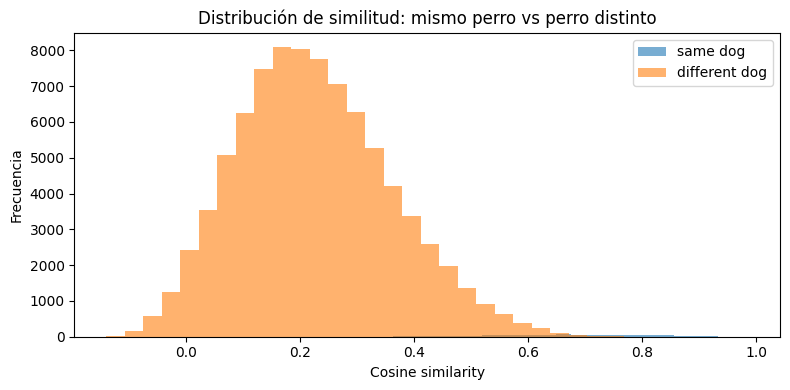

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_same_vs_different_similarity.png


In [16]:
# 14. Visualizar distribución same-dog vs different-dog

plt.figure(figsize=(8, 4))

if len(same_pairs_df) > 0:
    plt.hist(same_pairs_df["cosine_similarity"], bins=30, alpha=0.6, label="same dog")

if len(diff_pairs_df) > 0:
    plt.hist(diff_pairs_df["cosine_similarity"], bins=30, alpha=0.6, label="different dog")

plt.title("Distribución de similitud: mismo perro vs perro distinto")
plt.xlabel("Cosine similarity")
plt.ylabel("Frecuencia")
plt.legend()
plt.tight_layout()

DIST_PATH = FIGURES_PATH / f"{EMBED_PREFIX}_same_vs_different_similarity.png"
plt.savefig(DIST_PATH, dpi=150)
plt.show()

print("Figura guardada en:", DIST_PATH)

Aciertos Top-1:
Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_0.png


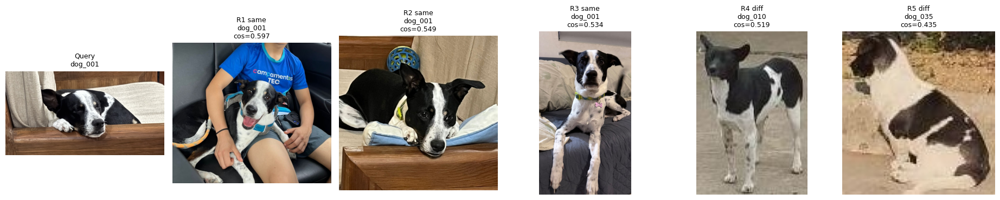

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_1.png


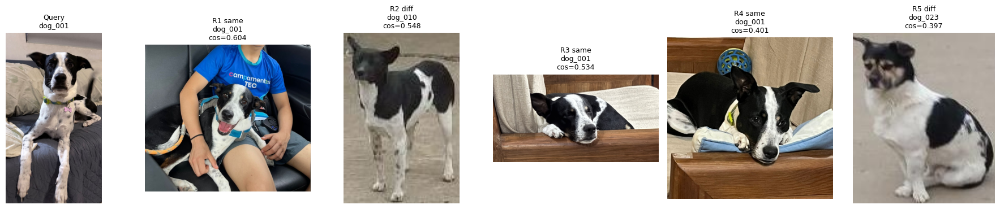

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_2.png


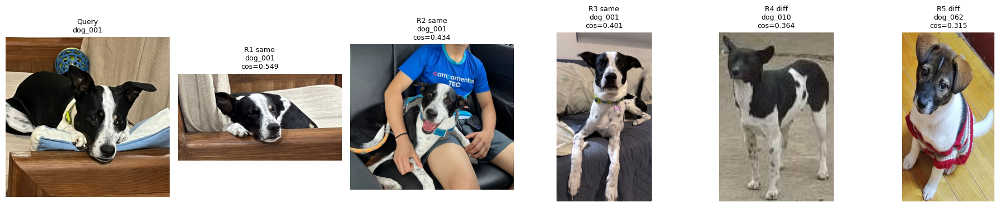

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_3.png


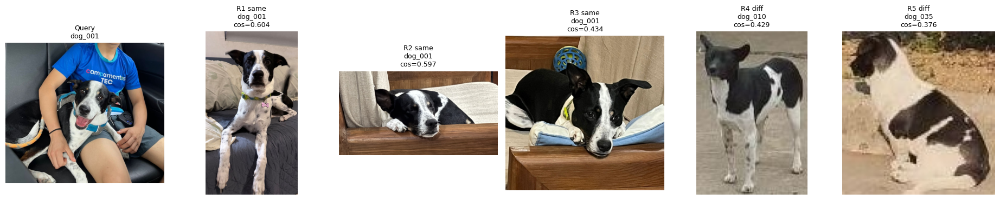

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_4.png


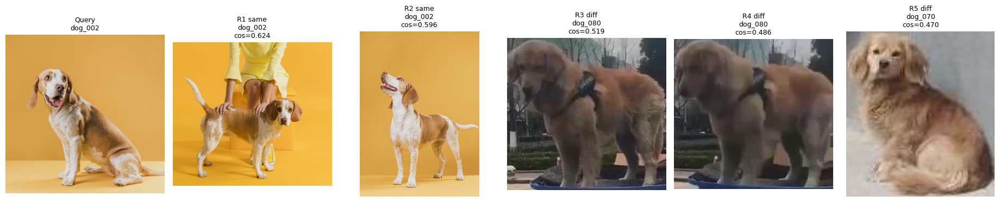

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_5.png


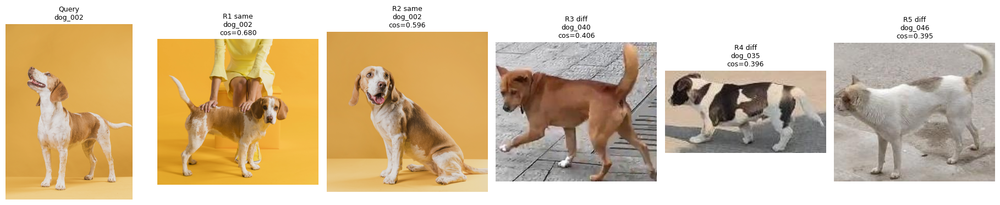

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_6.png


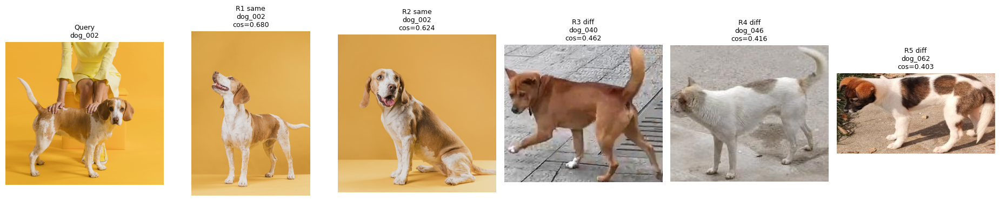

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_7.png


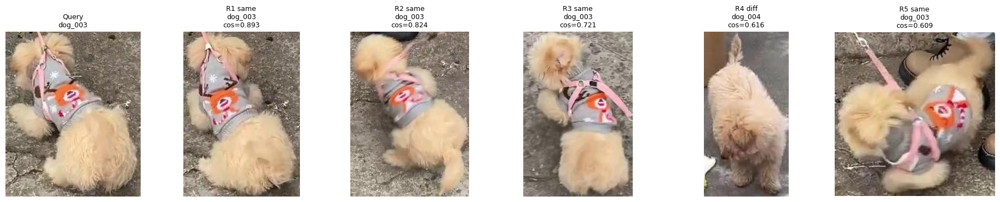

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_8.png


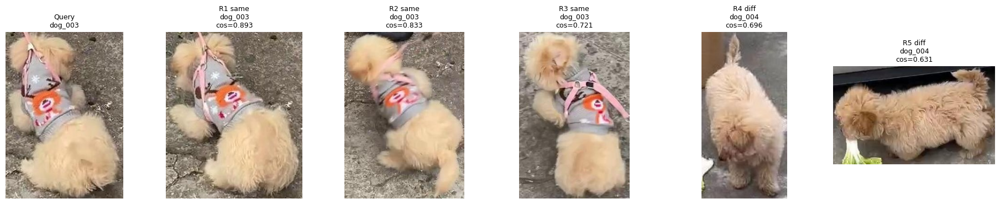

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_9.png


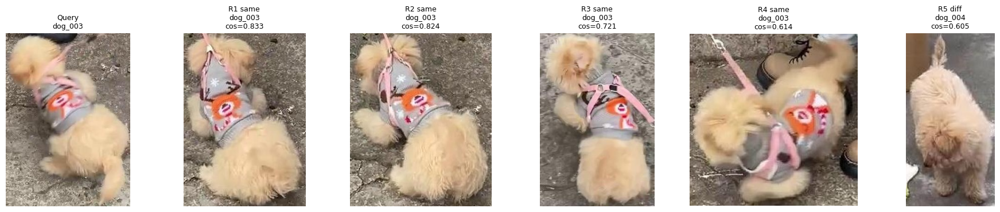

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_10.png


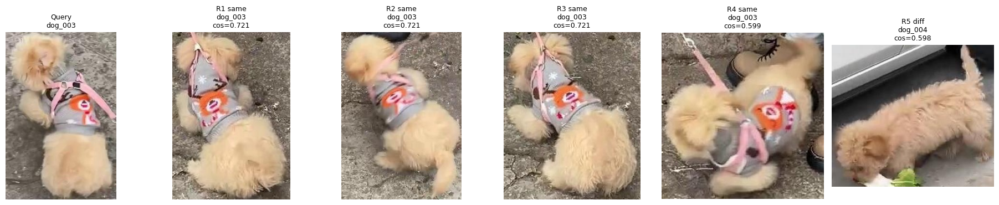

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_11.png


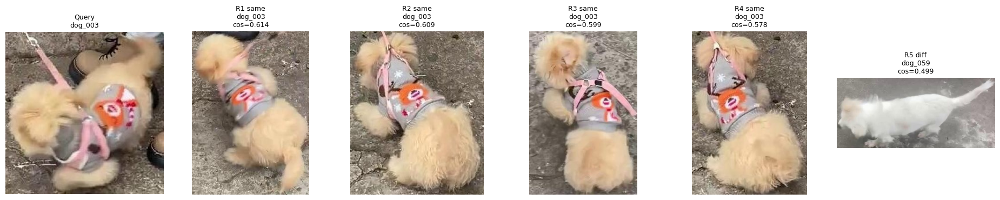

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_12.png


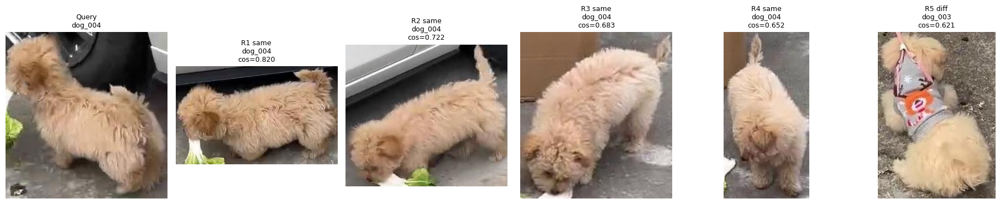

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_13.png


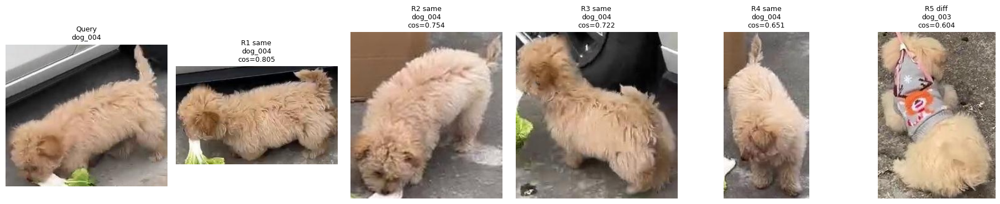

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_14.png


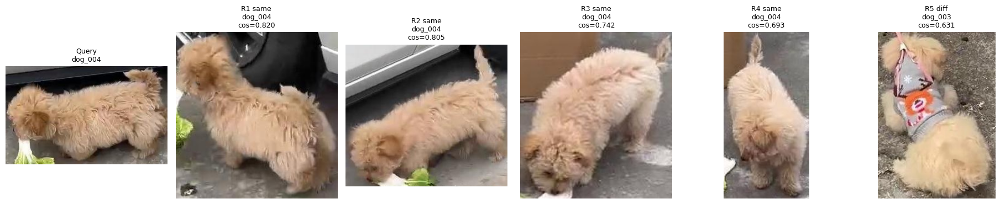

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_15.png


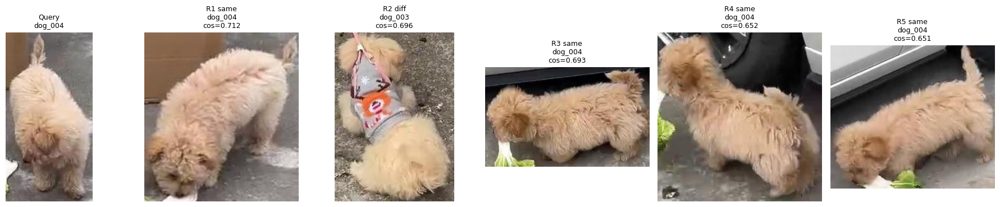

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_16.png


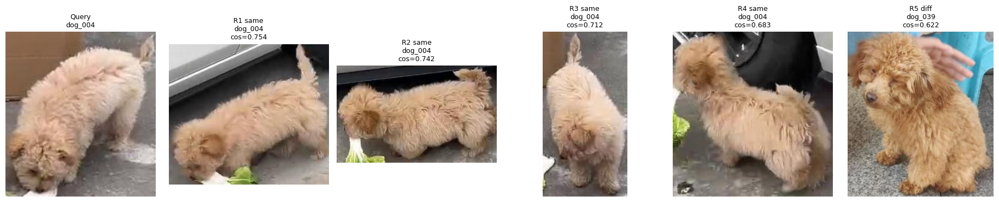

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_17.png


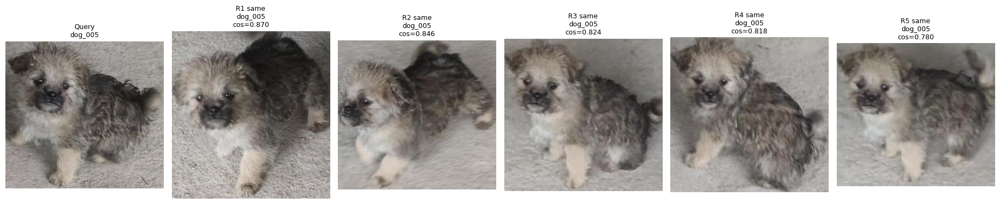

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_18.png


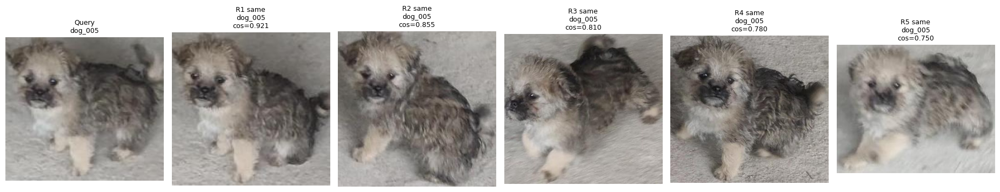

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_19.png


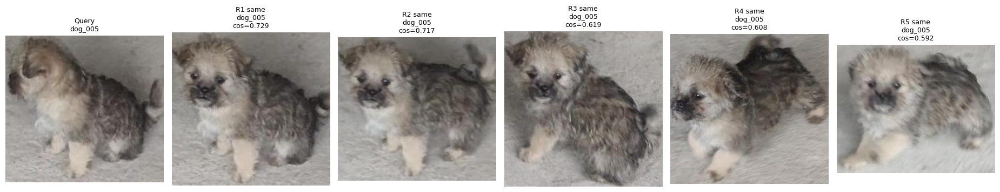

---------------------------------------------------------------------------------------

Fallos Top-5:
Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_46.png


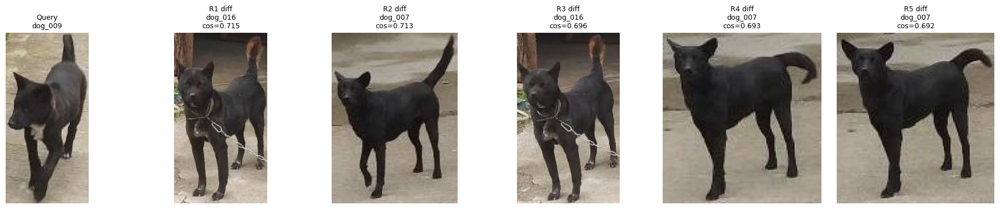

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_47.png


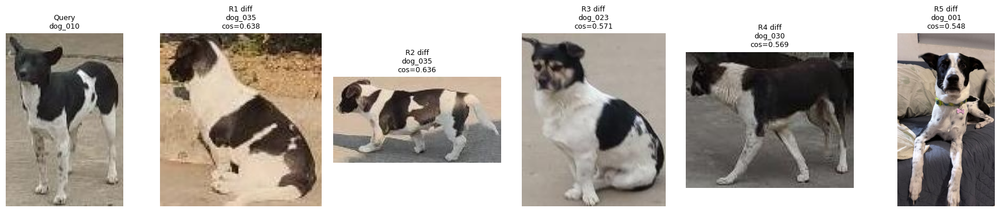

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_51.png


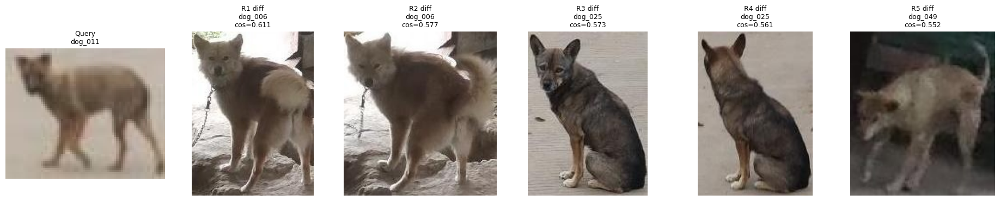

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_188.png


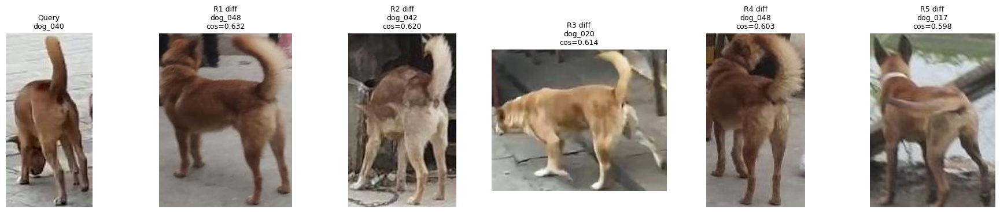

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step06b_optimized_efficientnetb0_reid_case_query_197.png


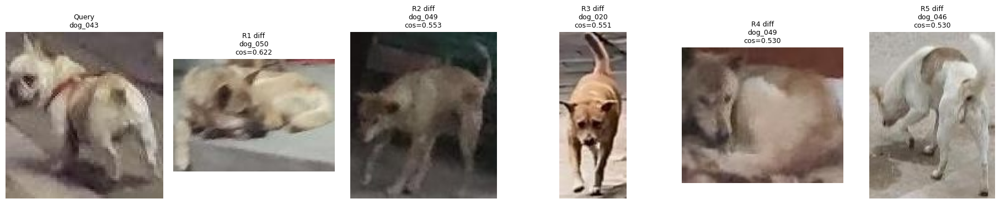

In [21]:
# 15. Visualizar ejemplos de aciertos y fallos

def show_reid_case(query_index, top_k=5, save=True):
    query_row = identity_embeddings_metadata_df.iloc[int(query_index)]

    neighbors = (
        identity_topk_df[
            (identity_topk_df["query_index"] == int(query_index)) &
            (identity_topk_df["neighbor_rank"] <= top_k)
        ]
        .sort_values("neighbor_rank")
    )

    image_paths = [query_row["crop_path"]]
    titles = [f"Query\n{query_row['dog_id']}"]

    for _, row in neighbors.iterrows():
        image_paths.append(row["neighbor_crop_path"])
        same_text = "same" if row["same_dog"] else "diff"
        titles.append(
            f"R{int(row['neighbor_rank'])} {same_text}\n"
            f"{row['neighbor_dog_id']}\n"
            f"cos={row['cosine_similarity']:.3f}"
        )

    cols = len(image_paths)
    plt.figure(figsize=(3.1 * cols, 3.8))

    for i, img_path in enumerate(image_paths):
        plt.subplot(1, cols, i + 1)

        try:
            img = Image.open(img_path).convert("RGB")
            plt.imshow(img)
            plt.title(titles[i], fontsize=9)
            plt.axis("off")
        except Exception as e:
            plt.text(0.5, 0.5, f"Error\n{e}", ha="center", va="center")
            plt.axis("off")

    plt.tight_layout()

    if save:
        fig_path = FIGURES_PATH / f"{EMBED_PREFIX}_reid_case_query_{query_index}.png"
        plt.savefig(fig_path, dpi=150)
        print("Figura guardada en:", fig_path)

    plt.show()


# Mostrar algunos aciertos Top-1 y algunos fallos Top-5
correct_cases = identity_eval_df[identity_eval_df["top1_same_dog"] == True]["query_index"].head(20).tolist()
failed_cases = identity_eval_df[identity_eval_df["top5_same_dog"] == False]["query_index"].head(5).tolist()

print("Aciertos Top-1:")
for qidx in correct_cases:
    show_reid_case(qidx, top_k=VISUAL_TOP_K, save=True)

print("---------------------------------------------------------------------------------------\n")

print("Fallos Top-5:")
for qidx in failed_cases:
    show_reid_case(qidx, top_k=VISUAL_TOP_K, save=True)

# Nota final

Este notebook formaliza el experimento optimizado que antes se ejecutó manualmente sobre el Paso 06.

La ruta formal del pipeline queda:

```text
01_Image_Quality_Curation.ipynb
02B_Dog_Detection_Cropping_YOLO_Optimized
03B_Dog_Visual_Embeddings_Optimized
04B_Vector_Search_Cosine_Similarity_Optimized
05B_Lost_Found_End_to_End_Search_Optimized
06B_Dog_ReIdentification_Evaluation_Optimized
07_Experiment_Summary_and_Model_Selection
```

La configuración evaluada por este notebook es:

```python
YOLO_MODEL = "yolo26s.pt"
CONF_THRESHOLD = 0.15
CROP_MARGIN = 0.35
EMBEDDING_BACKBONE = "EfficientNetB0"
```